In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append('/home/yasiyu/repos/PyCharm/CameraTraps') #'/Users/siyuyang/source/repos/GitHub_MSFT/CameraTraps'

In [3]:
import json
import requests
import os

import numpy as np
from PIL import Image
from visualization import visualization_utils

# Setting up a TF Serving API

Following the documentation at https://www.tensorflow.org/tfx/tutorials/serving/rest_simple#examine_your_saved_model

Useful explanation of TF Serving other than the official documentation: https://www.freecodecamp.org/news/how-to-deploy-tensorflow-models-to-production-using-tf-serving-4b4b78d41700/


## Setting up the API server

On the VM, examine the saved model:

```
saved_model_cli show --dir /home/otter/mnt/ai4edevfs/models/megadetector/megadetector_v3/step_686872_tf19/saved_model --all
```

Output for the TFODAPI trained detector:

```
MetaGraphDef with tag-set: 'serve' contains the following SignatureDefs:
signature_def['serving_default']:
  The given SavedModel SignatureDef contains the following input(s):
    inputs['inputs'] tensor_info:
        dtype: DT_UINT8
        shape: (-1, -1, -1, 3)
        name: image_tensor:0
  The given SavedModel SignatureDef contains the following output(s):
    outputs['detection_boxes'] tensor_info:
        dtype: DT_FLOAT
        shape: (-1, 100, 4)
        name: detection_boxes:0
    outputs['detection_classes'] tensor_info:
        dtype: DT_FLOAT
        shape: (-1, 100)
        name: detection_classes:0
    outputs['detection_scores'] tensor_info:
        dtype: DT_FLOAT
        shape: (-1, 100)
        name: detection_scores:0
    outputs['num_detections'] tensor_info:
        dtype: DT_FLOAT
        shape: (-1)
        name: num_detections:0
  Method name is: tensorflow/serving/predict
```

Note that we need to create a 'version' folder inside `saved_model` and put the `.pb` and `saved_variables` in there, but the `model_base_path` needs to remain at the `saved_model` level (_We do not specify the version folder in the path. The model versioning control is handled by TF Serving._). TFODAPI's exporting function did not insert this version folder. See this SO [post](https://stackoverflow.com/questions/45544928/tensorflow-serving-no-versions-of-servable-model-found-under-base-path).

Pull the `tensorflow/serving:1.11.0-gpu ` Docker image (haved tried `1.10.1-gpu` and `1.11.0-gpu ` and both work), and start it, exposing both the gRPC and REST ports:

```
nvidia-docker run -p 6000:8500 -p 6001:8501 --mount type=bind,source=/data/home/otter/mnt/ai4edevfs/models/megadetector/megadetector_v3/step_686872_tf19/saved_model/,target=/models/megadetector_v3 -e MODEL_NAME=megadetector_v3 -t tensorflow/serving:1.11.0-gpu 
```

Equivalent command without a Docker container:
```
tensorflow_model_server --port=6000 --rest_api_port=6001 --model_name=megadetector_v3 --model_base_path=/data/home/otter/mnt/ai4edevfs/models/megadetector/megadetector_v3/step_686872_tf19/saved_model/
```

It takes a minute to load the model; you should see log messages like the following when it is ready:
```
2019-08-05 06:09:26.778041: I tensorflow_serving/core/loader_harness.cc:86] Successfully loaded servable version {name: megadetector_v3 version: 1}
2019-08-02 23:48:55.432839: I tensorflow_serving/model_servers/server.cc:285] Running gRPC ModelServer at 0.0.0.0:8500 ...
2019-08-01 20:10:04.178489: I tensorflow_serving/model_servers/main.cc:337] Exporting HTTP/REST API at:localhost:8501 ...
[evhttp_server.cc : 235] RAW: Entering the event loop ...
```
The Python process should also show up in `nvidia-smi`.

#### Observations
- For both endpoints, can only input up to 8 images at a time.

In [5]:
num_images_to_upload = 2

In [6]:
image_dir = '../example/sample_input/test_images/'
image_paths = [os.path.join(image_dir, image_name) for image_name in sorted(os.listdir(image_dir))][-num_images_to_upload:]

images = [Image.open(image_path) for image_path in image_paths]
np_images = [np.asarray(image, np.uint8) for image in images]
images_stacked = np.stack(np_images, axis=0) if len(images) > 1 else np.expand_dims(np_images[0], axis=0)
images_stacked.shape

(2, 1536, 2048, 3)

## Calling the REST endpoint

In [7]:
vm_name = 'otter'
endpoint = 'http://{}vm.eastus.cloudapp.azure.com:6001/v1/models/megadetector_v3:predict'.format(vm_name)

In [8]:
%%time

# numpy array can't json serialize, so tolist()
data = json.dumps({'signature_name': 'serving_default', 'instances': images_stacked.tolist()})
print('Data: {} ... {}'.format(data[:50], data[len(data)-52:]))

Data: {"signature_name": "serving_default", "instances": ... 255, 255, 255], [255, 255, 255], [255, 255, 255]]]]}
CPU times: user 5.96 s, sys: 712 ms, total: 6.68 s
Wall time: 6.66 s


In [9]:
%%time

headers = {'content-type': 'application/json'}

json_response = requests.post(endpoint, data=data, headers=headers)

json_response.status_code
json_response.ok
if not json_response.ok:
    json_response.reason
    json_response.text
json_response.elapsed.total_seconds()

CPU times: user 14.3 ms, sys: 86.7 ms, total: 101 ms
Wall time: 3.06 s


3.059494

The first call for 1 image can be up to 18s, but subsequent calls are about 1.6 seconds

### Parse and render detections

In [10]:
predictions = json.loads(json_response.text)['predictions']

In [11]:
render_threshold = 0.8

results = []
for i, image_path in enumerate(image_paths):
    detections = []
    for box, clss, score in zip(predictions[i]['detection_boxes'], 
                                predictions[i]['detection_classes'], 
                                predictions[i]['detection_scores']):
        if score >= render_threshold:
            detections.append({
                'category': str(int(clss)),
                'conf': score,
                'bbox': [box[1], box[0], box[3] - box[1], box[2] - box[0]]
            })
    results.append({
        'file': image_path,
        'detections': detections
    })

In [ ]:
for res in results:
    im = Image.open(res['file'])
    visualization_utils.render_detection_bounding_boxes(res['detections'], 
                                                        im, 
                                                        confidence_threshold=render_threshold)
    im

## Calling the gRPC endpoint

Refenreces: 

https://github.com/tensorflow/serving/blob/master/tensorflow_serving/example/mnist_client.py

https://github.com/sthalles/deeplab_v3/blob/master/serving/deeplab_client.ipynb (outdated, grpc.beta should be moved to grpc)

In [ ]:
# !pip install tensorflow-serving-api

In [30]:
import grpc

import tensorflow as tf
tf.__version__

from tensorflow_serving.apis import predict_pb2
from tensorflow_serving.apis import prediction_service_pb2_grpc

'1.14.0'

In [31]:
hostport = '{}vm.eastus.cloudapp.azure.com:6000'.format(vm_name)  # the gRPC port

In [32]:
# create the RPC stub
channel = grpc.insecure_channel(hostport)
stub = prediction_service_pb2_grpc.PredictionServiceStub(channel)

In [35]:
%%time
request = predict_pb2.PredictRequest()
request.model_spec.name = 'megadetector_v3'
request.model_spec.signature_name = 'serving_default'

request.inputs['inputs'].CopyFrom(
    tf.contrib.util.make_tensor_proto(images_stacked, shape=images_stacked.shape))

result = stub.Predict(request) # can set timeout; can be both sync or async - use Predict.future() for async

CPU times: user 20.7 ms, sys: 11.6 ms, total: 32.3 ms
Wall time: 976 ms


First time can be longer; subsequently 1 image requests are about 630ms.

In [34]:
result

outputs {
  key: "detection_boxes"
  value {
    dtype: DT_FLOAT
    tensor_shape {
      dim {
        size: 2
      }
      dim {
        size: 100
      }
      dim {
        size: 4
      }
    }
    float_val: 0.0
    float_val: 0.0
    float_val: 0.9358593821525574
    float_val: 1.0
    float_val: 0.11058080196380615
    float_val: 0.0
    float_val: 0.926971435546875
    float_val: 0.6699913144111633
    float_val: 0.0
    float_val: 0.431397020816803
    float_val: 0.9453389644622803
    float_val: 1.0
    float_val: 0.0
    float_val: 0.046216581016778946
    float_val: 0.590969443321228
    float_val: 1.0
    float_val: 0.014232711866497993
    float_val: 0.0
    float_val: 0.47879132628440857
    float_val: 0.16726237535476685
    float_val: 0.04510561749339104
    float_val: 0.3034748435020447
    float_val: 0.6908717751502991
    float_val: 1.0
    float_val: 0.0008906046859920025
    float_val: 0.0007009124383330345
    float_val: 0.39339199662208557
    float_val: 0.507

In [36]:
type(result)

tensorflow_serving.apis.predict_pb2.PredictResponse

In [42]:
boxes_output = result.outputs['detection_boxes']
shape = tf.TensorShape(boxes_output.tensor_shape)
shape
boxes = np.array(boxes_output.float_val).reshape(shape.as_list())
boxes.shape

TensorShape([Dimension(2), Dimension(100), Dimension(4)])

(2, 100, 4)

In [46]:
classes_output = result.outputs['detection_classes']
shape = tf.TensorShape(classes_output.tensor_shape)
shape
classes = np.array(classes_output.float_val, dtype=int).reshape(shape.as_list())
classes.shape

TensorShape([Dimension(2), Dimension(100)])

(2, 100)

In [43]:
scores_output = result.outputs['detection_scores']
shape = tf.TensorShape(scores_output.tensor_shape)
shape
scores = np.array(scores_output.float_val).reshape(shape.as_list())
scores.shape

TensorShape([Dimension(2), Dimension(100)])

(2, 100)

In [52]:
results = []
for i, image_path in enumerate(image_paths):
    detections = []
    for box, clss, score in zip(boxes[i], classes[i], scores[i]):
        if score >= render_threshold:
            detections.append({
                'category': str(int(clss)),
                'conf': score,
                'bbox': [box[1], box[0], box[3] - box[1], box[2] - box[0]]
            })
    results.append({
        'file': image_path,
        'detections': detections
    })

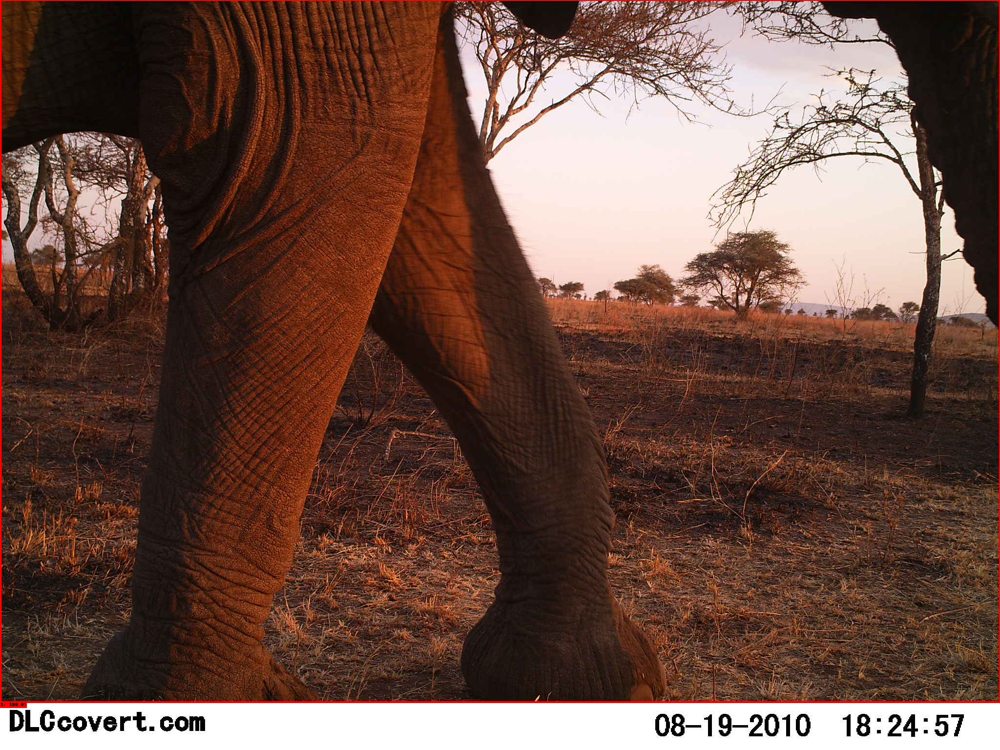

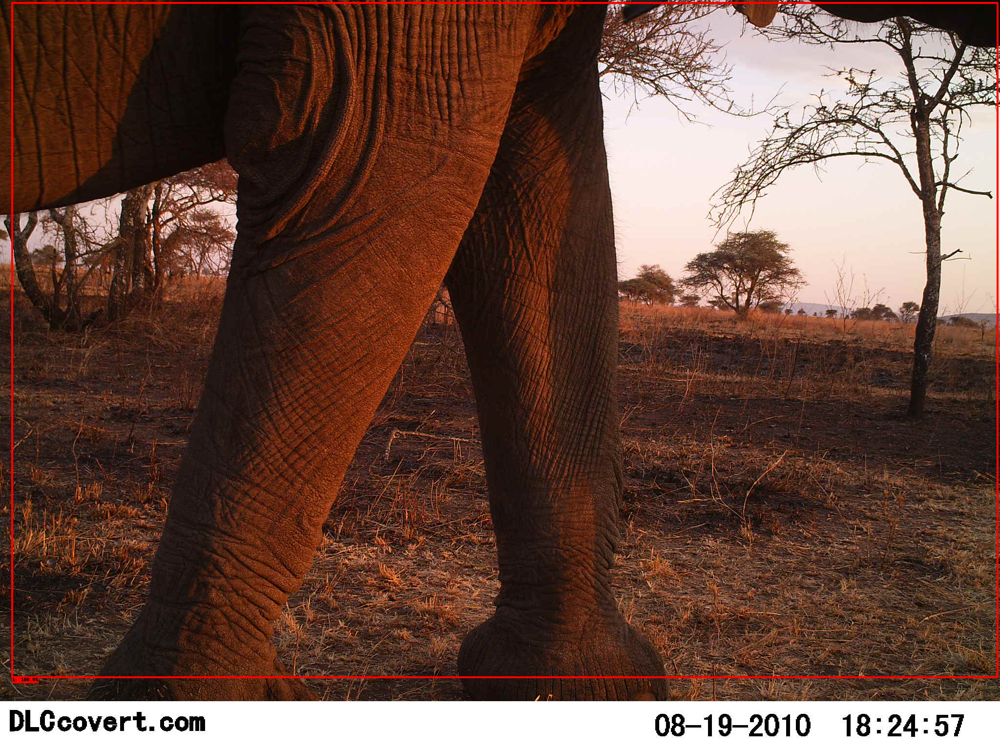

In [53]:
for res in results:
    im = Image.open(res['file'])
    visualization_utils.render_detection_bounding_boxes(res['detections'], 
                                                        im, 
                                                        confidence_threshold=render_threshold)
    im